# Transfer Learning Convolution Neural Network

## Contents

### Visualizing the Data

### Modeling the Data

### Baseline Model

### VGG16 Model

### ResNet50 Model

### DenseNet169 Model


Transfer Learning models have an incredible abilty to recognize objects in images. Having been trainined on large datasets, including the one used in this notebook - Imagenet,  they can be highly accurate with appropriate adjustments.  

This notebook runs through several different transfer learning models in order to find one with highest accuracy for flower image recognition. We'll be creating an initial baseline model, and we'll also be testing the accuracies of VGG16, Resnet50, and DenseNet169. 

For our most accurate model, we'll also run stylized flower images created using the Magenta arbitrary style transfer model. 

Note: The code in this notebook has been updated to be compatible with Tensorflow 2.0+.

We begin by mounting Google Drive to Colab. 

In [0]:
# Mount Drive to Colab
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


Our dataset consists of five species of flowers - daisy, dandelion, rose, sunflower, and tulip. They have already been distributed into training, validation, and test folders with a 60-20-20 split, respectively, for each species. There are a total of 4242 images. Further below, we'll see how many images are in each folder. 

In [0]:
# Unzip the flowers dataset from a zip file located in Drive
!unzip "/content/drive/My Drive/flowers_dataset.zip"

In [0]:
# Import ImageDataGenerator to allow us to create batches and perform data augmentation
from keras.preprocessing.image import ImageDataGenerator

Using TensorFlow backend.


Below, we name the appropriate path for each folder within Google Drive. Notice that there is a fourth folder - test_styled. These are the stylized images,  which have been randomly chosen from the test dataset and stylized using arbitrary style transfer. 

The stylized dataset contains 2000 images: 20 images of each species were crossed with 5 styles each for 4 diffreent interpolation weights. While brief additional details ont he stylized images are given later in this notebook when we test them on our most promising model, for further details on how these images were created, please consult the Style Transfer notebook located in the same Github repository. 

In [0]:
# Paths to access the correct image folders
train_path = 'flowers_dataset/train'
valid_path = 'flowers_dataset/valid'
test_path = 'flowers_dataset/test'
test_styled_path = 'drive/My Drive/test_styled'

In [0]:
# use ImageDataGenerator to transform the data one batch at a time
train_batches = ImageDataGenerator().flow_from_directory(train_path, 
                                                                   target_size=(224, 224), 
                                                                   classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                                   batch_size=32)
valid_batches = ImageDataGenerator().flow_from_directory(valid_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)

test_batches = ImageDataGenerator().flow_from_directory(test_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)
test_styled_batches = ImageDataGenerator().flow_from_directory(test_styled_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)

Found 2592 images belonging to 5 classes.
Found 865 images belonging to 5 classes.
Found 866 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


In [0]:
# classes assigned by keras
test_batches.class_indices

{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}

In [0]:
# view the training data batch and its shape
imgs, labels = next(train_batches)
imgs.shape

(32, 224, 224, 3)

In [0]:
# the transformed array of the first image of the first batch of training data
imgs[0]

array([[[  7.,   6.,   2.],
        [  9.,  10.,   5.],
        [  0.,   5.,   0.],
        ...,
        [ 23.,  25.,  14.],
        [ 21.,  28.,  10.],
        [ 17.,  21.,   6.]],

       [[  3.,   4.,   0.],
        [  4.,   9.,   3.],
        [  6.,   9.,   2.],
        ...,
        [ 11.,  15.,   0.],
        [ 19.,  22.,  11.],
        [ 19.,  20.,  12.]],

       [[  6.,   1.,   0.],
        [  6.,   8.,   3.],
        [  3.,   4.,   0.],
        ...,
        [ 27.,  24.,  15.],
        [ 12.,  19.,   1.],
        [ 17.,  21.,   6.]],

       ...,

       [[116., 129., 137.],
        [111., 126., 123.],
        [235., 225., 233.],
        ...,
        [ 32.,  49.,   7.],
        [ 31.,  48.,   4.],
        [ 24.,  45.,   2.]],

       [[117., 129., 125.],
        [195., 208., 198.],
        [201., 195., 199.],
        ...,
        [ 22.,  48.,   3.],
        [ 26.,  52.,   5.],
        [ 21.,  44.,   0.]],

       [[ 72.,  83.,  85.],
        [242., 229., 223.],
        [112., 1

In [0]:
# there are 32 labels for each image since there are 32 images per batch, and each label has 5 elements due to there being 5 categories of flowers
labels.shape

(32, 5)

In [0]:
labels

array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.],
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.]], dtype=float32)

## Visualizing the Data

We'll create a function to allow us to visualize random samples of  our training data.

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools
import keras
from keras.preprocessing.image import ImageDataGenerator

# plots images with labels within jupyter notebook
def plots(ims, figsize=(12,6), rows=1, interp=False, titles=None):
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if (ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
    f = plt.figure(figsize=figsize)
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None:
            sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i], interpolation=None if interp else 'none')

/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


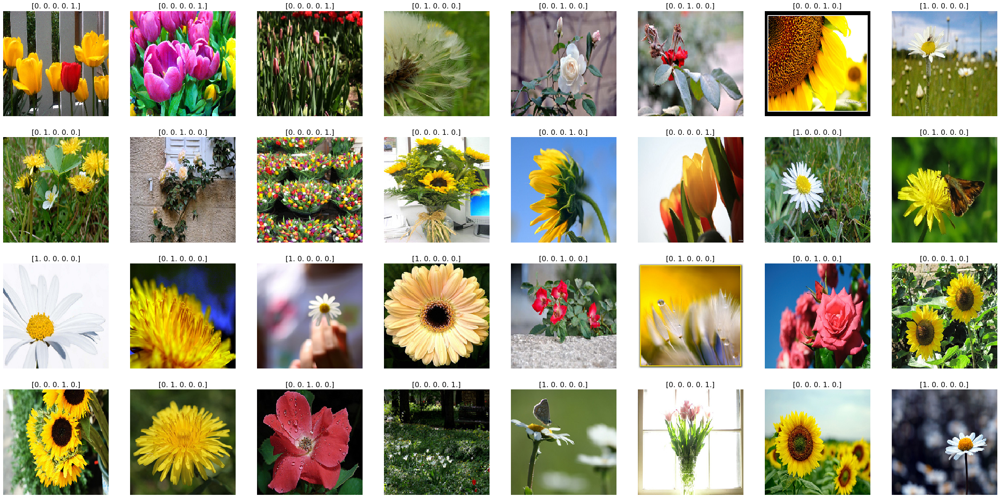

In [0]:
# Plot sample images from each of the 5 categories
#['daisy','dandelion', 'rose', 'sunflower', 'tulip']
plots(imgs, figsize=(40,20), rows = 4, titles=labels)

There are a variety of different types of images. Some are closeups of just a single flower, while others multiple flowers fo a specific species. Yet, others may also include humans or insects.

## Modeling the Data

In [0]:
# Import various keras tools
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential

from keras.layers import Conv2D, MaxPooling2D, Dropout
from keras.layers.core import Dense, Flatten, Activation
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.normalization import BatchNormalization

from keras.preprocessing import image
from keras.models import Model, load_model
from keras.applications import imagenet_utils
from sklearn.metrics import confusion_matrix
import itertools
import matplotlib.pyplot as plt
%matplotlib inline

## Baseline model

For our baseline model, we've normalized the data by divding the pixel size by 255 to scale all pictures between 0 and 1.  

In [0]:
# transform the data and normalize it 
# generates batches of normalized data.

train_batches = ImageDataGenerator(rescale = 1./255).flow_from_directory(train_path, 
                                                                   target_size=(224, 224), 
                                                                   classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                                   batch_size=32)
valid_batches = ImageDataGenerator(rescale = 1./255).flow_from_directory(valid_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)

test_batches = ImageDataGenerator(rescale = 1./255).flow_from_directory(test_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)
test_styled_batches = ImageDataGenerator(rescale = 1./255).flow_from_directory(test_styled_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)

Found 2592 images belonging to 5 classes.
Found 865 images belonging to 5 classes.
Found 866 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


In [0]:
# Adding convolutional layers to our model
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(512, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='softmax'))

In [0]:
# Use Adam optimizer
model.compile(keras.optimizers.Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [0]:
#Run the model and time how long it takes
%%time

# Use fit_generator for the baseline model 
history = model.fit_generator(
      train_batches,
      steps_per_epoch=81,
      epochs=30,
      validation_data=valid_batches,
      validation_steps=40,
      verbose = 2)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/30
81/81 - 13s - loss: 1.3535 - accuracy: 0.3962 - val_loss: 1.2548 - val_accuracy: 0.4363
Epoch 2/30
81/81 - 12s - loss: 1.0851 - accuracy: 0.5478 - val_loss: 1.1546 - val_accuracy: 0.4756
Epoch 3/30
81/81 - 12s - loss: 0.9708 - accuracy: 0.6184 - val_loss: 1.2144 - val_accuracy: 0.4992
Epoch 4/30
81/81 - 12s - loss: 0.8906 - accuracy: 0.6447 - val_loss: 1.1252 - val_accuracy: 0.5308
Epoch 5/30
81/81 - 12s - loss: 0.7994 - accuracy: 0.6960 - val_loss: 1.1941 - val_accuracy: 0.5542
Epoch 6/30
81/81 - 12s - loss: 0.7341 - accuracy: 0.7307 - val_loss: 1.0916 - val_accuracy: 0.5580
Epoch 7/30
81/81 - 12s - loss: 0.6827 - accuracy: 0.7469 - val_loss: 1.0826 - val_accuracy: 0.5591
Epoch 8/30
81/81 - 12s - loss: 0.5936 - accuracy: 0.7778 - val_loss: 1.1700 - val_accuracy: 0.5773
Epoch 9/30
81/81 - 12s - loss: 0.5519 - accuracy: 0.7894 - val_loss: 1.0435 - val_accuracy: 0.5747
Epoch 10/30
81/81 - 12s - loss: 0

In [0]:
#Save the baseline model
model.save('flowers_baseline.h5')

In [0]:
# Create a function to plot our loss and accuracy 
def plot_curves():

  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(1, len(acc) + 1)

  plt.figure(figsize=(9,6))

  plt.plot(epochs, acc, 'bo', label='Training acc')
  plt.plot(epochs, val_acc, 'b', label='Validation acc')
  plt.title('Training and validation accuracy')
  plt.legend()

  plt.figure(figsize=(9,6))

  plt.plot(epochs, loss, 'bo', label='Training loss')
  plt.plot(epochs, val_loss, 'b', label='Validation loss')
  plt.title('Training and validation loss')
  plt.legend()

  plt.show()

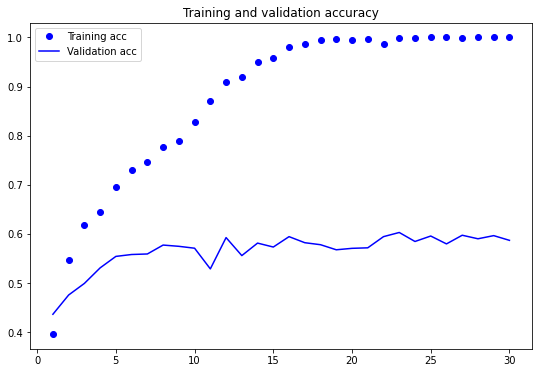

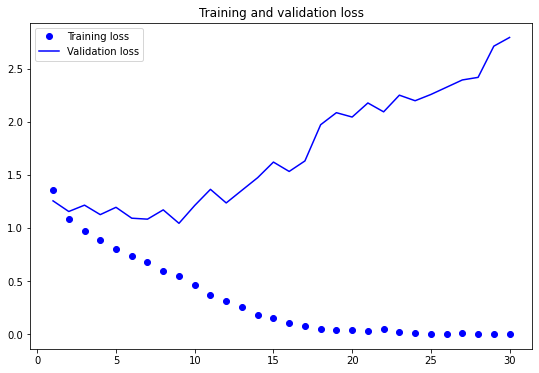

In [0]:
plot_curves()

As we can see, our base model is terribly overfitted and the validation accuracy reaches only 60%. Let's try to make some adjustments below.

We'll augment the training data to allow the model to view the images from different perspectives.

In [0]:
# add data augmentation and dropout
train_batches = ImageDataGenerator(rescale = 1./255,
                                   rotation_range=10,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   shear_range=0.15,
                                   zoom_range=0.1,
                                   channel_shift_range=10.,
                                   horizontal_flip=True, 
                                   fill_mode='nearest').flow_from_directory(train_path, 
                                                                   target_size=(224, 224), 
                                                                   classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                                   batch_size=32)
                                   
valid_batches = ImageDataGenerator(rescale = 1./255).flow_from_directory(valid_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)

test_batches = ImageDataGenerator(rescale = 1./255).flow_from_directory(test_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)

test_styled_batches = ImageDataGenerator(rescale = 1./255).flow_from_directory(test_styled_path, 
                                                        target_size=(224, 224), 
                                                        classes=['daisy','dandelion', 'rose', 'sunflower', 'tulip'], 
                                                        batch_size=32)                                  

Found 2592 images belonging to 5 classes.
Found 865 images belonging to 5 classes.
Found 866 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


In [0]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dropout(rate = 1-0.5))
model.add(tf.keras.layers.Dense(512, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='softmax'))

In [0]:
%%time

model.compile(keras.optimizers.Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit_generator(
      train_batches, 
    steps_per_epoch=81,
      epochs=30,
      validation_data=valid_batches,
      validation_steps=40,
      verbose = 2)

Epoch 1/30
81/81 - 38s - loss: 1.3535 - accuracy: 0.4047 - val_loss: 1.2511 - val_accuracy: 0.4580
Epoch 2/30
81/81 - 38s - loss: 1.1037 - accuracy: 0.5417 - val_loss: 1.2159 - val_accuracy: 0.4900
Epoch 3/30
81/81 - 38s - loss: 1.0237 - accuracy: 0.6022 - val_loss: 1.2289 - val_accuracy: 0.5296
Epoch 4/30
81/81 - 38s - loss: 0.9705 - accuracy: 0.6154 - val_loss: 1.1669 - val_accuracy: 0.5556
Epoch 5/30
81/81 - 38s - loss: 0.9093 - accuracy: 0.6427 - val_loss: 1.1062 - val_accuracy: 0.5690
Epoch 6/30
81/81 - 38s - loss: 0.8795 - accuracy: 0.6694 - val_loss: 1.1251 - val_accuracy: 0.5452
Epoch 7/30
81/81 - 37s - loss: 0.8663 - accuracy: 0.6609 - val_loss: 1.1591 - val_accuracy: 0.5772
Epoch 8/30
81/81 - 37s - loss: 0.8247 - accuracy: 0.6933 - val_loss: 1.1085 - val_accuracy: 0.5709
Epoch 9/30
81/81 - 37s - loss: 0.8088 - accuracy: 0.6921 - val_loss: 1.0860 - val_accuracy: 0.5829
Epoch 10/30
81/81 - 37s - loss: 0.7808 - accuracy: 0.6995 - val_loss: 1.0304 - val_accuracy: 0.6045
Epoch 11/

In [0]:
model.save('flowers_augmentation_dropout.h5')

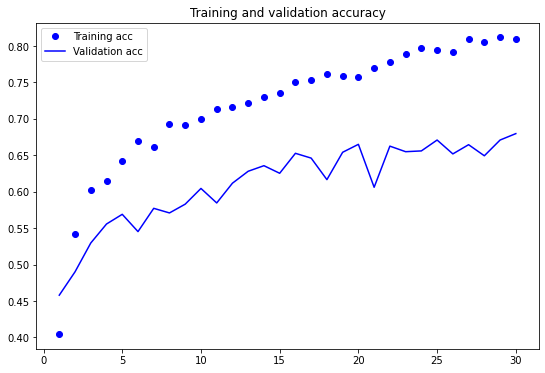

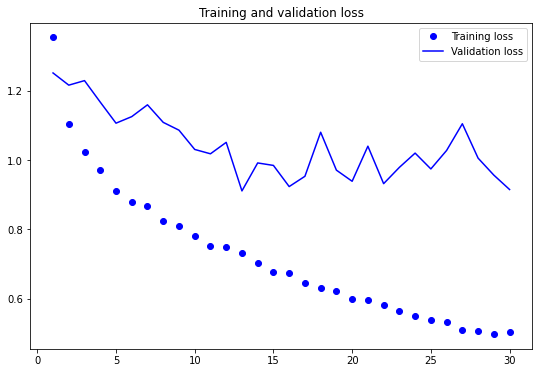

In [0]:
plot_curves()

In [0]:
# restore the model and do some test set evaluation.
from tensorflow.keras.models import load_model
base_model = load_model('flowers_augmentation_dropout.h5')

In [0]:
test_loss, test_acc = base_model.evaluate_generator(test_batches, steps=27)
print('test loss:', test_loss)
print('test acc:', test_acc)

Instructions for updating:
Please use Model.evaluate, which supports generators.
test loss: 0.7162064909934998
test acc: 0.7280092835426331


While the data augmentation helped quite a bit with overfitting and accuracy, the accuracy is still very low. Next, we'll try several pretrainied models.

## VGG16 Model

VGG16 has a small number of hyper parameters and has 16 layers with weights.

In [0]:
# download VGG16 model
vgg16_model = keras.applications.vgg16.VGG16()

553467904/553467096 [==============================] - 8s 0us/step


In [0]:
vgg16_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [0]:
# Create a new model without the last layer and freeze the other layers
model = tf.keras.Sequential()
for layer in vgg16_model.layers[:-1]:
    model.add(layer)
    layer.trainable = False

In [0]:
# add the new classifier
model.add(tf.keras.layers.Dense(5, activation='softmax'))

In [0]:
# summary of the adjusted model
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

In [0]:
# train the feature extractor
model.compile(keras.optimizers.Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [0]:
# Include several callbacks
keras.callbacks.ModelCheckpoint
keras.callbacks.EarlyStopping
keras.callbacks.LearningRateScheduler
keras.callbacks.ReduceLROnPlateau
keras.callbacks.CSVLogger

tensorflow.python.keras.callbacks.CSVLogger

Below, we'll be using three callbacks.

ReduceLRonPlateau reduces the learning rateif the accuracy becomes stagnant for a number of epochs. The patience is set at 7.  

EarlyStopping allows the model to be stopped if it sees no loss improvement over a certain number of epochs. Here, we've put the patience at 10.

ModelCheckpoint saves the best epoch of a given run, which we can then load for test accuracy.

In [0]:
# Run with freezing and 30 epochs
 # run for 2-30 epochs

%%time

callbacks_list = [
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=7,
        verbose = 1
    ),
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        mode = 'min',
        restore_best_weights = True,
        verbose = 1
    ),
    keras.callbacks.ModelCheckpoint(
        filepath='vgg16-feature-extraction.h5',
        monitor='val_loss',
        save_best_only=True,
    )
]


# use this to grab batches from the image data generator
# tell model.fit about the validation data.
# steps per epoch size of dataset/batchsize . 2594/32
history = model.fit_generator(train_batches, 
                    steps_per_epoch=81, 
                    callbacks=callbacks_list,
                    validation_data=valid_batches, 
                    validation_steps=40, 
                    epochs=30, 
                    verbose = 2)

Epoch 1/30
81/81 - 44s - loss: 0.9175 - accuracy: 0.6952 - val_loss: 1.0742 - val_accuracy: 0.5739 - lr: 1.0000e-04
Epoch 2/30
81/81 - 43s - loss: 0.8652 - accuracy: 0.7184 - val_loss: 1.0691 - val_accuracy: 0.5653 - lr: 1.0000e-04
Epoch 3/30
81/81 - 41s - loss: 0.8670 - accuracy: 0.7137 - val_loss: 1.0935 - val_accuracy: 0.5813 - lr: 1.0000e-04
Epoch 4/30
81/81 - 44s - loss: 0.8196 - accuracy: 0.7199 - val_loss: 1.0303 - val_accuracy: 0.6157 - lr: 1.0000e-04
Epoch 5/30
81/81 - 42s - loss: 0.8250 - accuracy: 0.7203 - val_loss: 1.0391 - val_accuracy: 0.5854 - lr: 1.0000e-04
Epoch 6/30
81/81 - 44s - loss: 0.8013 - accuracy: 0.7392 - val_loss: 1.0090 - val_accuracy: 0.6093 - lr: 1.0000e-04
Epoch 7/30
81/81 - 42s - loss: 0.7676 - accuracy: 0.7504 - val_loss: 1.0249 - val_accuracy: 0.6061 - lr: 1.0000e-04
Epoch 8/30
81/81 - 43s - loss: 0.7745 - accuracy: 0.7299 - val_loss: 0.9710 - val_accuracy: 0.6059 - lr: 1.0000e-04
Epoch 9/30
81/81 - 41s - loss: 0.7525 - accuracy: 0.7515 - val_loss: 0.9

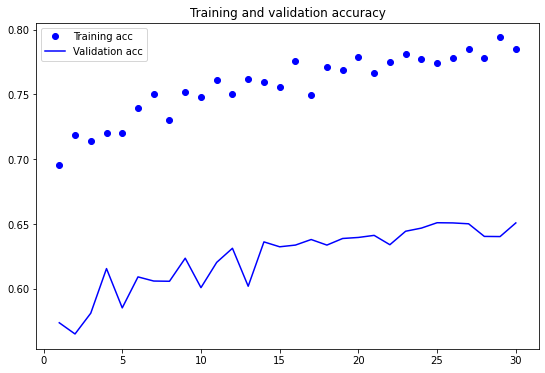

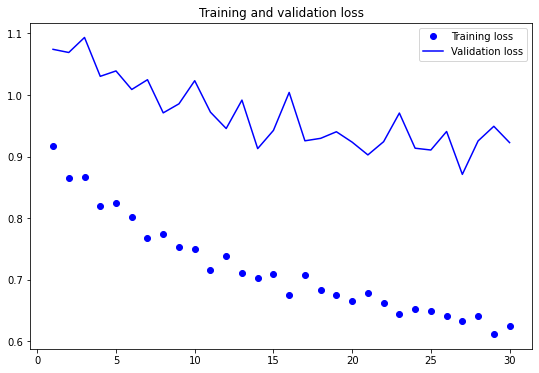

In [0]:
plot_curves()

This first run with the VGG16 model didn't offer high accuracy, so we'll try further adjustments to the layers.

In [0]:
# adjust two more layers of the model 
# from keras.applications import VGG16

conv_base16 = tf.keras.applications.VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

58892288/58889256 [==============================] - 1s 0us/step


In [0]:
# model summary
conv_base16.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [0]:
#Adjust several layers
model = tf.keras.Sequential()
model.add(conv_base16)
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='softmax'))

In [0]:
print('Number of trainable weights '
         'before freezing the conv base:', len(model.trainable_weights))
conv_base16.trainable = False
print('Number of trainable weights '
          'after freezing the conv base:', len(model.trainable_weights))

Number of trainable weights before freezing the conv base: 30
Number of trainable weights after freezing the conv base: 4


In [0]:
model.compile(optimizer=keras.optimizers.RMSprop(lr=2e-5), loss='categorical_crossentropy', metrics=['accuracy'])

In [0]:
# run once more with lower patience on ReduceLRonPlateau
%%time

callbacks_list = [
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=3,
        verbose = 1
    ),
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        mode = 'min',
        restore_best_weights = True,
        verbose = 1
    ),
    keras.callbacks.ModelCheckpoint(
        filepath='feature-extraction-rmsprop-replaced-top-lr-lower.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]


# use this to grab batches from the image data generator
# tell model.fit about the validation data.
# steps per epoch size of dataset/batchsize . 2594/32
history = model.fit_generator(train_batches, 
                    steps_per_epoch=81, 
                    callbacks=callbacks_list,
                    validation_data=valid_batches, 
                    validation_steps=40, 
                    epochs=30, 
                    verbose = 2)

Epoch 1/30

Epoch 00001: val_loss improved from inf to 1.06442, saving model to feature-extraction-rmsprop-replaced-top-lr-lower.h5
81/81 - 42s - loss: 1.1173 - accuracy: 0.5845 - val_loss: 1.0644 - val_accuracy: 0.5821 - lr: 2.0000e-05
Epoch 2/30

Epoch 00002: val_loss improved from 1.06442 to 0.90622, saving model to feature-extraction-rmsprop-replaced-top-lr-lower.h5
81/81 - 42s - loss: 0.7293 - accuracy: 0.7581 - val_loss: 0.9062 - val_accuracy: 0.6573 - lr: 2.0000e-05
Epoch 3/30

Epoch 00003: val_loss improved from 0.90622 to 0.87800, saving model to feature-extraction-rmsprop-replaced-top-lr-lower.h5
81/81 - 42s - loss: 0.6279 - accuracy: 0.7882 - val_loss: 0.8780 - val_accuracy: 0.6724 - lr: 2.0000e-05
Epoch 4/30

Epoch 00004: val_loss improved from 0.87800 to 0.78213, saving model to feature-extraction-rmsprop-replaced-top-lr-lower.h5
81/81 - 42s - loss: 0.5534 - accuracy: 0.8121 - val_loss: 0.7821 - val_accuracy: 0.7126 - lr: 2.0000e-05
Epoch 5/30

Epoch 00005: val_loss improv

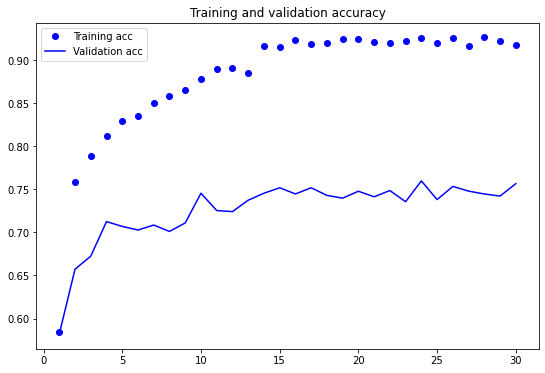

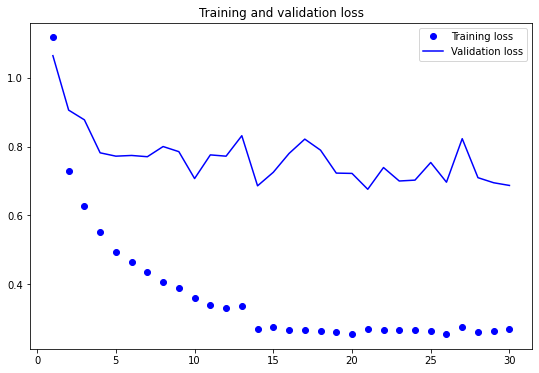

In [0]:
plot_curves()

While there is some improvement in accuracy, we can probably still do better. 

We'll unfreeze the layers from the previous run and decrease the learning rate. 

In [0]:
# modify the layers

conv_base16.trainable = True

set_trainable = False
for layer in conv_base16.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [0]:
len(model.trainable_weights)

10

In [0]:
model.compile(optimizer=keras.optimizers.RMSprop(lr=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

In [0]:

%%time
   
callbacks_list = [
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=5,
        verbose = 1
    ),
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        mode = 'min',
        restore_best_weights = True,
        verbose = 1
    ),
    keras.callbacks.ModelCheckpoint(
        filepath='fine-tuning-vgg16.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]


# use this to grab batches from the image data generator
# tell model.fit about the validation data.
# steps per epoch size of dataset/batchsize . 2594/32
history = model.fit_generator(train_batches, 
                    steps_per_epoch=81, 
                    callbacks=callbacks_list,
                    validation_data=valid_batches, 
                    validation_steps=40, 
                    epochs=30, 
                    verbose = 2)

Epoch 1/30

Epoch 00001: val_loss improved from inf to 0.85006, saving model to fine-tuning-vgg16.h5
81/81 - 43s - loss: 0.2251 - accuracy: 0.9252 - val_loss: 0.8501 - val_accuracy: 0.7282 - lr: 1.0000e-05
Epoch 2/30

Epoch 00002: val_loss improved from 0.85006 to 0.81633, saving model to fine-tuning-vgg16.h5
81/81 - 42s - loss: 0.1942 - accuracy: 0.9290 - val_loss: 0.8163 - val_accuracy: 0.7254 - lr: 1.0000e-05
Epoch 3/30

Epoch 00003: val_loss improved from 0.81633 to 0.76253, saving model to fine-tuning-vgg16.h5
81/81 - 42s - loss: 0.1698 - accuracy: 0.9394 - val_loss: 0.7625 - val_accuracy: 0.7694 - lr: 1.0000e-05
Epoch 4/30

Epoch 00004: val_loss did not improve from 0.76253
81/81 - 42s - loss: 0.1300 - accuracy: 0.9576 - val_loss: 0.9385 - val_accuracy: 0.7644 - lr: 1.0000e-05
Epoch 5/30

Epoch 00005: val_loss did not improve from 0.76253
81/81 - 42s - loss: 0.1295 - accuracy: 0.9587 - val_loss: 0.7800 - val_accuracy: 0.7550 - lr: 1.0000e-05
Epoch 6/30

Epoch 00006: val_loss impr

In [0]:
model.save('fine-tuning-vgg16.h5')

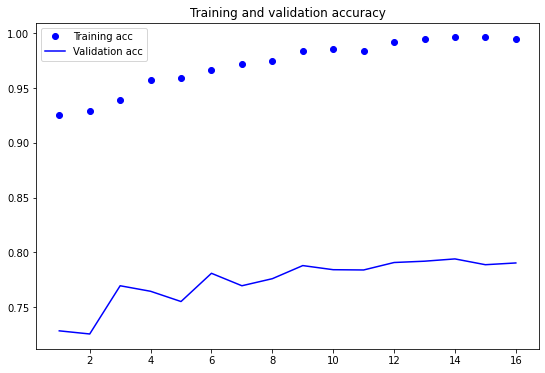

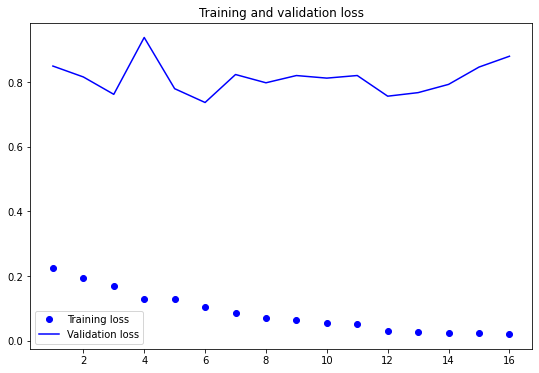

In [0]:
plot_curves()

In [0]:
from tensorflow.keras.models import load_model
best_vgg16_model = load_model('fine-tuning-vgg16.h5')

In [0]:
# Print test loss and accuracy
test_loss, test_acc = best_vgg16_model.evaluate_generator(test_batches, steps=27)
print('test loss:', test_loss)
print('test acc:', test_acc)

test loss: 0.4857686758041382
test acc: 0.84375


This is a fairly significant improvement over our base model and the fine tuning helped increase the accuracy. Next we'll try ResNet50 and DenseNet50.

## ResNet50 Model

ResNet50 has a different structure than VGG16, with 50 layers. It also allows for skip connections, which may help with the issue of vanishing gradients.

In [0]:
# Load the ResNet50 model
#from keras.applications import ResNet50

conv_base50 = tf.keras.applications.ResNet50(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

94773248/94765736 [==============================] - 1s 0us/step


In [0]:
conv_base50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
___________________________________________________________________________________________

In [0]:
model = tf.keras.Sequential()
model.add(conv_base50)
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='softmax'))

In [0]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 7, 7, 2048)        23587712  
_________________________________________________________________
flatten_3 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dense_5 (Dense)              (None, 256)               25690368  
_________________________________________________________________
dense_6 (Dense)              (None, 5)                 1285      
Total params: 49,279,365
Trainable params: 49,226,245
Non-trainable params: 53,120
_________________________________________________________________


In [0]:
print('Number of trainable weights '
         'before freezing the conv base:', len(model.trainable_weights))
conv_base50.trainable = False
print('Number of trainable weights '
          'after freezing the conv base:', len(model.trainable_weights))

Number of trainable weights before freezing the conv base: 216
Number of trainable weights after freezing the conv base: 4


In [0]:
model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [0]:
%%time

callbacks_list = [
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=7,
        verbose = 1
    ),
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        mode = 'min',
        restore_best_weights = True,
        verbose = 1
    ),
    keras.callbacks.ModelCheckpoint(
        filepath='feature-extraction-resnet50.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose = 1
    ), 
    
]

# use this to grab batches from the image data generator
# tell model.fit about the validation data.
# steps per epoch size of dataset/batchsize . 2594/32
history = model.fit_generator(train_batches, 
                    steps_per_epoch=81, 
                    callbacks=callbacks_list,
                    validation_data=valid_batches, 
                    validation_steps=40, 
                    epochs=30, 
                    verbose = 2)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/30

Epoch 00001: val_loss improved from inf to 1.59048, saving model to feature-extraction-resnet50.h5
81/81 - 18s - loss: 3.5662 - accuracy: 0.3206 - val_loss: 1.5905 - val_accuracy: 0.4147 - lr: 0.0010
Epoch 2/30

Epoch 00002: val_loss improved from 1.59048 to 1.42991, saving model to feature-extraction-resnet50.h5
81/81 - 16s - loss: 1.4458 - accuracy: 0.4603 - val_loss: 1.4299 - val_accuracy: 0.4211 - lr: 0.0010
Epoch 3/30

Epoch 00003: val_loss did not improve from 1.42991
81/81 - 14s - loss: 1.5524 - accuracy: 0.4599 - val_loss: 1.9501 - val_accuracy: 0.4015 - lr: 0.0010
Epoch 4/30

Epoch 00004: val_loss improved from 1.42991 to 1.41884, saving model to feature-extraction-resnet50.h5
81/81 - 16s - loss: 1.3284 - accuracy: 0.5147 - val_loss: 1.4188 - val_accuracy: 0.4676 - lr: 0.0010
Epoch 5/30

Epoch 00005: val_loss did not improve from 1.41884
81/81 - 15s - loss: 1.1988 - accuracy: 0.5575 - val_l

The accuracy was very low, so let's try adjusting some of the layers.

In [0]:
# Restore the model weights
# modify the layers

conv_base50.trainable = True

set_trainable = False
for layer in conv_base50.layers:
    if layer.name.startswith( 'conv5' ):
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [0]:
len(model.trainable_weights)

44

In [0]:
model.compile(optimizer=keras.optimizers.Adam(lr=1e-5, decay = 1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

In [0]:
%%time


callbacks_list = [
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=5,
        verbose = 1
    ),
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        mode = 'min',
        restore_best_weights = True,
        verbose = 1
    ),
    keras.callbacks.ModelCheckpoint(
        filepath='fine-tuning-resnet50.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )


]


# use this to grab batches from the image data generator
# tell model.fit about the validation data.
# steps per epoch size of dataset/batchsize . 2594/32
history = model.fit_generator(train_batches, 
                    steps_per_epoch=81, 
                    callbacks=callbacks_list,
                    validation_data=valid_batches, 
                    validation_steps=40, 
                    epochs=30, 
                    verbose = 2)

Epoch 1/30

Epoch 00001: val_loss improved from inf to 6.75062, saving model to fine-tuning-resnet50.h5
81/81 - 19s - loss: 3.1673 - accuracy: 0.4302 - val_loss: 6.7506 - val_accuracy: 0.2521 - lr: 1.0000e-05
Epoch 2/30

Epoch 00002: val_loss improved from 6.75062 to 5.36422, saving model to fine-tuning-resnet50.h5
81/81 - 18s - loss: 0.9715 - accuracy: 0.6458 - val_loss: 5.3642 - val_accuracy: 0.2762 - lr: 1.0000e-05
Epoch 3/30

Epoch 00003: val_loss improved from 5.36422 to 4.63703, saving model to fine-tuning-resnet50.h5
81/81 - 18s - loss: 0.6256 - accuracy: 0.7689 - val_loss: 4.6370 - val_accuracy: 0.2800 - lr: 1.0000e-05
Epoch 4/30

Epoch 00004: val_loss improved from 4.63703 to 2.76796, saving model to fine-tuning-resnet50.h5
81/81 - 18s - loss: 0.4276 - accuracy: 0.8499 - val_loss: 2.7680 - val_accuracy: 0.3034 - lr: 1.0000e-05
Epoch 5/30

Epoch 00005: val_loss improved from 2.76796 to 2.06240, saving model to fine-tuning-resnet50.h5
81/81 - 18s - loss: 0.3165 - accuracy: 0.899

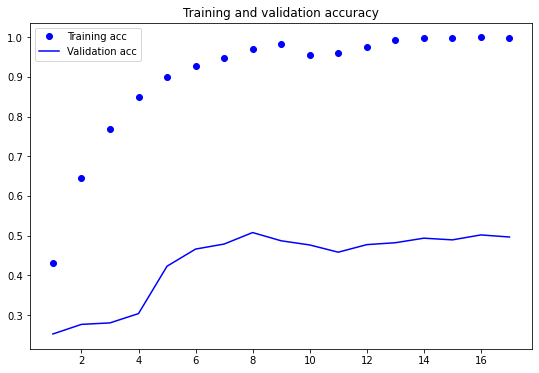

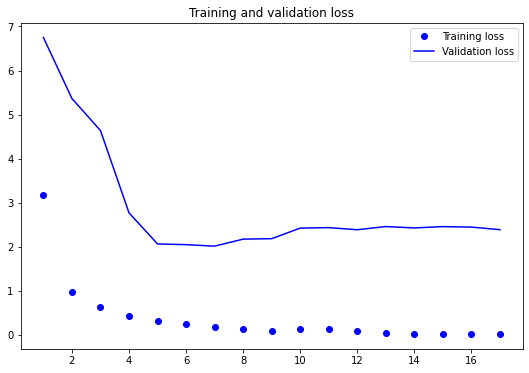

In [0]:
plot_curves()

In [0]:
model.save('fine-tuning-resnet50.h5')

In [0]:
from tensorflow.keras.models import load_model
best_resnet_model = load_model('fine-tuning-resnet50.h5')

In [0]:
test_loss, test_acc = best_resnet_model.evaluate_generator(test_batches, steps=27)
print('test loss:', test_loss)
print('test acc:', test_acc)


Instructions for updating:
Please use Model.evaluate, which supports generators.
test loss: 1.796429991722107
test acc: 0.5231481194496155


The ResNet model was surprisingly innaccurate. In fact, it did far worse than our baseline model.

## DenseNet169 Model

DenseNets allow for every layer in a model to be directly connected to one another. They also require fewer parameters than traditional CNNs.

In [0]:
# fine tune using feature extraction
#from keras.applications import DenseNet169

conv_base1692 = tf.keras.applications.DenseNet169(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

In [0]:
conv_base1692.summary()

Model: "densenet169"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_4 (ZeroPadding2D (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_4[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
________________________________________________________________________________________

In [0]:
model = tf.keras.Sequential()
model.add(conv_base1692)
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='softmax'))

In [0]:
print('Number of trainable weights '
         'before freezing the conv base:', len(model.trainable_weights))
conv_base1692.trainable = False
print('Number of trainable weights '
          'after freezing the conv base:', len(model.trainable_weights))

Number of trainable weights before freezing the conv base: 510
Number of trainable weights after freezing the conv base: 4


In [0]:
model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [0]:

callbacks_list = [
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=7,
        verbose = 1
    ),
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        mode = 'min',
        restore_best_weights = True,
        verbose = 1
    ),
    keras.callbacks.ModelCheckpoint(
        filepath='feature-extraction-densenet.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose = 1
    )
]


# use this to grab batches from the image data generator
# tell model.fit about the validation data.
# steps per epoch size of dataset/batchsize . 2594/32
history = model.fit_generator(train_batches, 
                    steps_per_epoch=81, 
                    callbacks=callbacks_list,
                    validation_data=valid_batches, 
                    validation_steps=40, 
                    epochs=30, 
                    verbose = 2)

Epoch 1/30

Epoch 00001: val_loss improved from inf to 1.52671, saving model to feature-extraction-densenet.h5
81/81 - 20s - loss: 3.8141 - accuracy: 0.7728 - val_loss: 1.5267 - val_accuracy: 0.7972 - lr: 0.0010
Epoch 2/30

Epoch 00002: val_loss improved from 1.52671 to 1.32806, saving model to feature-extraction-densenet.h5
81/81 - 17s - loss: 0.4613 - accuracy: 0.9128 - val_loss: 1.3281 - val_accuracy: 0.8038 - lr: 0.0010
Epoch 3/30

Epoch 00003: val_loss did not improve from 1.32806
81/81 - 15s - loss: 0.1073 - accuracy: 0.9699 - val_loss: 1.3492 - val_accuracy: 0.8144 - lr: 0.0010
Epoch 4/30

Epoch 00004: val_loss did not improve from 1.32806
81/81 - 15s - loss: 0.0323 - accuracy: 0.9915 - val_loss: 1.4668 - val_accuracy: 0.8062 - lr: 0.0010
Epoch 5/30

Epoch 00005: val_loss did not improve from 1.32806
81/81 - 15s - loss: 0.0057 - accuracy: 0.9985 - val_loss: 1.3927 - val_accuracy: 0.8186 - lr: 0.0010
Epoch 6/30

Epoch 00006: val_loss did not improve from 1.32806
81/81 - 15s - los

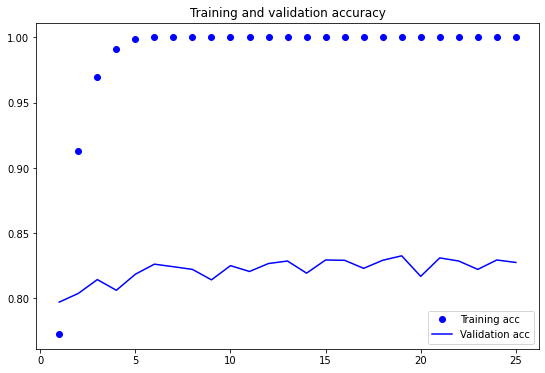

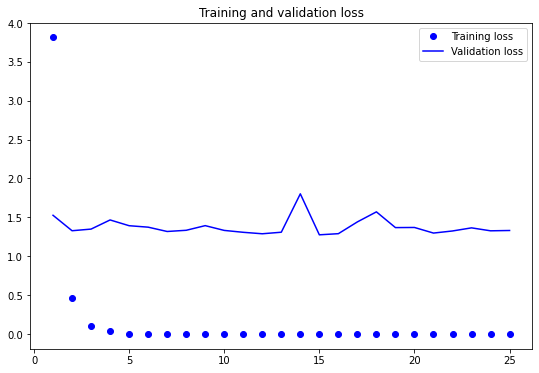

In [0]:
plot_curves()

This is easily our most promising model. Let's make further adjustments by resoring the model weights and modifying some of the layers.

In [0]:
# Restore the model weights
# modify the layers

conv_base1692.trainable = True

set_trainable = False
for layer in conv_base1692.layers:
    if layer.name.startswith( 'conv5' ):
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [0]:
len(model.trainable_weights)

198

In [0]:
# adding in weight decay with Adam

epochs = 50
learning_rate = 1e-5
decay_rate = learning_rate / epochs

model.compile(optimizer=tf.keras.optimizers.Adam(lr=learning_rate, decay = decay_rate), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

We'll riun for 50 epochs instead of 30 to allow for the possibility of further accuracy improvement. We'll also turn off the EarlyStopping to allow the model to run for the entire 50 epochs.

In [0]:
%%time


callbacks_list = [
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.01,
        patience=5,
        verbose = 1
    ),
    #keras.callbacks.EarlyStopping(
     #   monitor='val_loss',
      #  patience=7,
       # mode = 'min',
        #restore_best_weights = True,
        #verbose = 1
    #),
    keras.callbacks.ModelCheckpoint(
        filepath='dn169-fine-tuning-densenet-learning-rate-scheduler.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )

]


# use this to grab batches from the image data generator
# tell model.fit about the validation data.
# steps per epoch size of dataset/batchsize . 2594/32
history = model.fit_generator(train_batches, 
                    steps_per_epoch=81, 
                    callbacks=callbacks_list,
                    validation_data=valid_batches, 
                    validation_steps=40, 
                    epochs=epochs, 
                    verbose = 2)

Epoch 1/50

Epoch 00001: val_loss improved from inf to 1.41841, saving model to dn169-fine-tuning-densenet-learning-rate-scheduler.h5
81/81 - 22s - loss: 0.0751 - accuracy: 0.9765 - val_loss: 1.4184 - val_accuracy: 0.8183 - lr: 1.0000e-05
Epoch 2/50

Epoch 00002: val_loss improved from 1.41841 to 1.36951, saving model to dn169-fine-tuning-densenet-learning-rate-scheduler.h5
81/81 - 19s - loss: 0.0285 - accuracy: 0.9911 - val_loss: 1.3695 - val_accuracy: 0.8112 - lr: 1.0000e-05
Epoch 3/50

Epoch 00003: val_loss did not improve from 1.36951
81/81 - 17s - loss: 0.0129 - accuracy: 0.9958 - val_loss: 1.6173 - val_accuracy: 0.7870 - lr: 1.0000e-05
Epoch 4/50

Epoch 00004: val_loss did not improve from 1.36951
81/81 - 17s - loss: 0.0039 - accuracy: 0.9985 - val_loss: 1.5321 - val_accuracy: 0.7989 - lr: 1.0000e-05
Epoch 5/50

Epoch 00005: val_loss did not improve from 1.36951
81/81 - 17s - loss: 0.0102 - accuracy: 0.9961 - val_loss: 1.5044 - val_accuracy: 0.7942 - lr: 1.0000e-05
Epoch 6/50

Ep

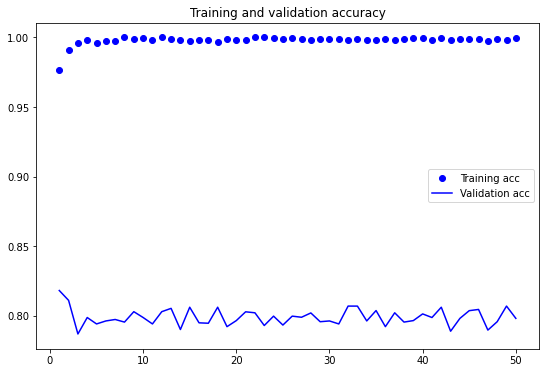

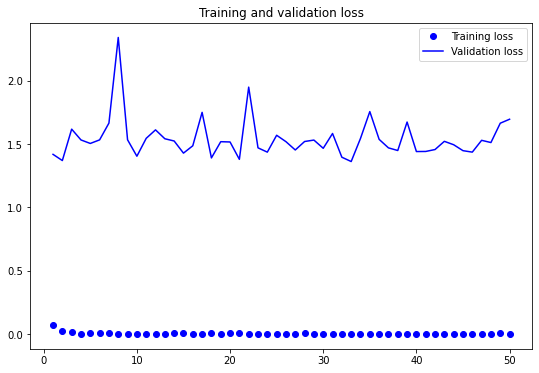

In [0]:
plot_curves()

In [0]:
model.save('dn169-fine-tuning-densenet-learning-rate-scheduler.h5')

In [0]:
# restore the model and do some test set evaluation.
from tensorflow.keras.models import load_model
best_dn169_model = load_model('dn169-fine-tuning-densenet-learning-rate-scheduler.h5')

In [0]:
test_loss, test_acc = best_dn169_model.evaluate_generator(test_batches, steps=27)    # Please use Model.evaluate, which supports generators
print('test loss:', test_loss)
print('test acc:', test_acc)

test loss: 0.8404521942138672
test acc: 0.8761574029922485


Whiel the additional epochs did little to increase accuracy and did, unfortunately, increase the validation loss slightly, DenseNet169 still gave us the highest accuracy levels of the four models that we tested. Let's now introduce the stylized images dataset and test how accurately the model identifies flower species correctly. 

As mentioned earlier, the stylized image dataset consists of 2000 images. 20 images were randomly selected from each species from the test data. They were then crossed with 5 different art styles - abstract expressionism, cyberpunk, fractal art, pop art, post-impressionsim. For each style, they are crossed at four different interpolation weights - 0.2, 0.4, 0.6, 0.8 - with 0.2 having the least amount of influence from the style image, to 0.8 having the most. 

In [0]:
# Split the images into image and label data
imgs_st, labels_st = next(test_styled_batches)

In [0]:
test_styled_batches.class_indices

{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}

In [0]:
imgs_st.shape

(32, 224, 224, 3)

In [0]:
labels_st.shape

(32, 5)

Looking at some of the stylized images, it's fairly easy to determine the species of flower. But in other images, it's not only hard to determine the species, it's difficult to say that we're even looking a flower. 

These more ambiguous images are not only challenging for humans, but they may be even more challenging for our deep learning model. Hence, we are likely going to see a considerably lower accuracy compared to the previous test accuracy. 

/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


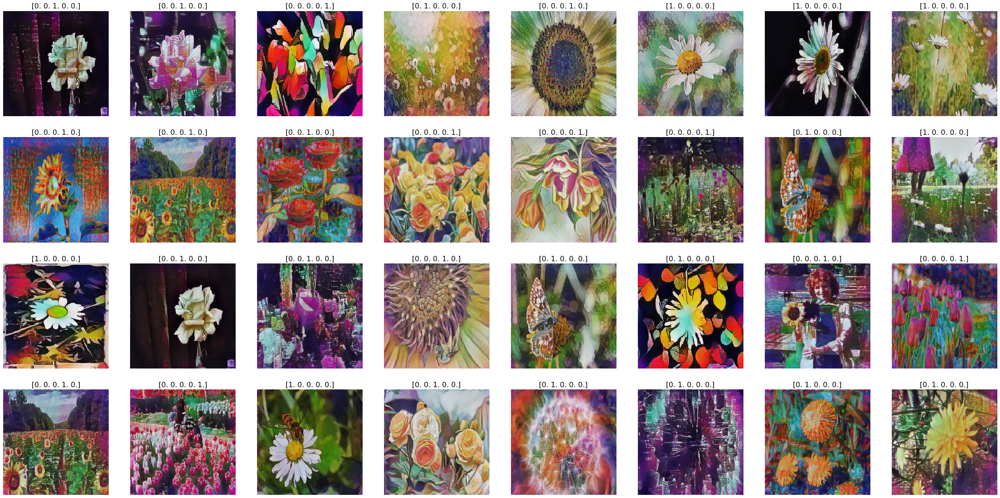

In [0]:
#['daisy','dandelion', 'rose', 'sunflower', 'tulip']
plots(imgs_st, figsize=(40,20), rows = 4, titles=labels_st)

In [0]:
test_loss, test_acc = best_dn169_model.evaluate_generator(test_styled_batches, steps=27)
print('test loss:', test_loss)
print('test acc:', test_acc)

ERROR! Session/line number was not unique in database. History logging moved to new session 59
test loss: 3.221344232559204
test acc: 0.6099537014961243


Our DenseNet model, while doing fairly well with our test dataset, does quite poorly with the stylized dataset. It's likely due to the aforementioned reasons - in some of the images, the model is probably finding it difficult to identify actual flowers, much less the correct species. 

In the next part of the project, we'll look to not only improve the test accuracy but the stylized accuracy as well. We'll do this by implementing a cylical learning rate in addition to test time augmentation. 